In [1]:
using Jlsca.Trs
using Jlsca.Sca
using Jlsca.Align
using Plots
using Statistics

In [2]:
fname = "/home/kali/machines/self/hw/cpa/nMY.ts"
keyByteNum = 1
condavg = false;

In [3]:
trs = InspectorTrace(fname)

Opened /home/kali/machines/self/hw/cpa/nMY.ts, #traces 986, #samples 1042 (UInt8), #data 16


InspectorTrace(0, 986, 16, 1, UInt8, 1042, 24, IOStream(<file /home/kali/machines/self/hw/cpa/nMY.ts>), "/home/kali/machines/self/hw/cpa/nMY.ts", 24, false, 18, true, missing, missing, MetaData(0, Pass[], Pass[], missing, missing, missing, ReentrantLock(nothing, 0x00000000, 0x00, Base.GenericCondition{Base.Threads.SpinLock}(Base.IntrusiveLinkedList{Task}(nothing, nothing), Base.Threads.SpinLock(0)), (0, 0, 0)), true, #undef, #undef, #undef))

(985, 1042)(1, 1042)

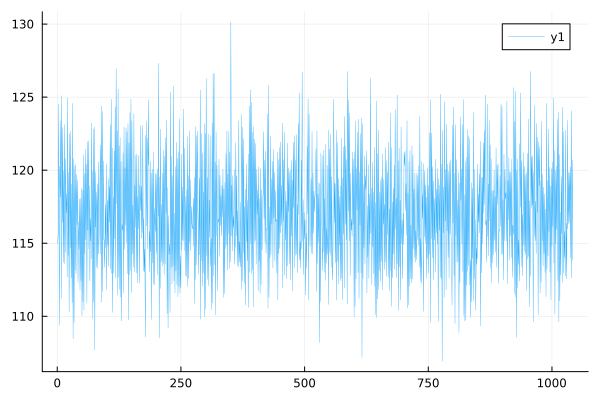

In [4]:
nrTraces = 985
((data, samples),eof) = readTraces(trs, 1:nrTraces)

print(size(samples))
s = mean(samples, dims=1)
print(size(s))

plot(s[:], linewidth=.3)

(985, 1042)(1, 1042)

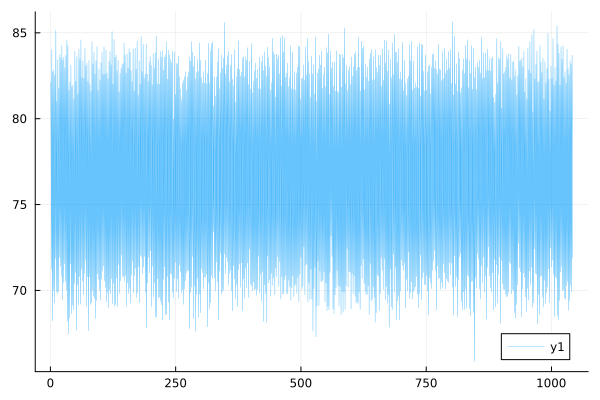

In [5]:
print(size(samples))
s = std(samples, dims=1)
print(size(s))

plot(s[:], linewidth=.3)

In [6]:
# reset(trs)

# addSamplePass(trs, float)

# # selecting the reference pattern in the first traces
# referencestart = 50
# referenceend = 500
# reference = trs[1][2][referencestart:referenceend]

# # in the search of alignemt, traces will be shifted by max this amount of samples
# maxShift = 200

# # the rejection threshold
# corvalMin = 0.0

# # create the alignment engine
# alignstate = CorrelationAlignFFT(reference, referencestart, maxShift)

# # add the alignment as a sample processing pass
# # the end of the next line is somewhat complex I must say :) But it's an experimental toolbox, yay!
# addSamplePass(trs, x -> ((shift,corval) = correlationAlign(x, alignstate); corval > corvalMin ? circshift(x, shift) : Vector{eltype(x)}(0)))

# # execute the alignment pass by reading the traces
# ((data,samples),eof) = readTraces(trs, 1:nrTraces)

# # remove the alignment apss
# # popSamplePass(trs)
# # popSamplePass(trs)

(985, 1042)(1, 1042)

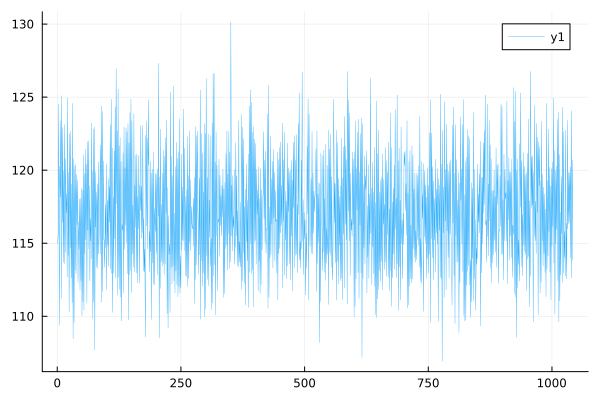

In [7]:
print(size(samples))
s = mean(samples, dims=1)
print(size(s))

plot(s[:], linewidth=.3)

In [8]:
attack = AesSboxAttack()
attack.xor = true
anal = CPA()

anal.leakages = [Bit(0)]

params = DpaAttack(attack,anal)
params.maxCols = 1042
params.maxColsPost = 1042
params.dataOffset = 1
params.targetOffsets = collect(1:16)
params.updateInterval = 10
params.knownKey = missing
params.keepraw = true

true

In [9]:
getTrs() = trs

@time rankdata = sca(DistributedTrace(getTrs), params, 1, nrTraces);


Jlsca running in Julia version: 1.10.4, 1 processes/1 workers/10 threads per worker

DPA parameters
attack:       AES Sbox CIPHER KL128 FORWARD Xor
mode:         CIPHER
key length:   KL128
direction:    FORWARD
xor:          true
analysis:     CPA
leakages:     bit0
maximization: abs global max
data at:      1
targets:      [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
max cols into post processor: 1042
max cols into non-inc analysis: 1042

phase: 1 / 1, #targets 16

Attacking columns 1:1042 out of 1042 columns (run 1 out of 1)
Running "Cond avg" on trace range 1:1:10, 1 data passes, 0 sample passes

Averaged 10 input traces into 16 averages, UInt8 data type, Float64 sample type
CPA on samples shape (10, 1042) (range 1:1042) and data shape (10,)
Results @ 10 rows, 1042 cols (10 rows consumed)
target: 1, phase: 1, #candidates 256
rank:   1, candidate: 0x1b, score: 0.988732 @ 309
rank:   2, candidate: 0x2f, score: 0.985594 @ 789
rank:   3, candidate: 0x16, score: 0.983601 @ 15

Excessive output truncated after 524293 bytes.

target: 12, phase: 1, #candidates 256
rank:   1, candidate: 0xa8, score: 0.315524 @ 946
rank:   2, candidate: 0x08, score: 0.294434 @ 389
rank:   3, candidate: 0xa5, score: 0.292484 @ 184
rank:   4, candidate: 0x34, score: 0.286910 @ 73
rank:   5, candidate: 0x46, score: 0.278843 @ 270
recovered key material: a8
CPA on samples shape (237, 1042) (range 1:1042) and data shape (237,)
Results @ 237 rows, 1042 cols (740 rows consumed)
target: 13, phase: 1, #candidates 256
rank:   1, candidate: 0x98, score: 0.333963 @ 436
rank:   2, candidate: 0xf9, score: 0.293824 @ 452
rank:   3, candidate: 0x85, score: 0.284614 @ 1033
rank:   4, candidate: 0xee, score: 0.283090 @ 894
rank:   5, candidate: 0xc2, score: 0.276387 @ 366
recovered key material: 98
CPA on samples shape (221, 1042) (range 1:1042) and data shape (221,)
Results @ 221 rows, 1042 cols (740 rows consumed)
target: 14, phase: 1, #candidates 256
rank:   1, candidate: 0x1b, score: 0.296399 @ 41


In [10]:
propertynames(rankdata)

(:nrConsumedRows, :nrConsumedCols, :nrRows, :nrCols, :scores, :offsets, :combinedScores, :intervals, :nrLeakages, :keepraw, :raw)

In [11]:
rankdata.scores

Dict{Int64, Dict{Int64, Dict{Int64, Matrix{Float64}}}} with 1 entry:
  1 => Dict(5=>Dict(1=>[0.865871 0.74803 … 0.264377 0.272948; 0.864164 0.781881…

In [12]:
rankdata.raw[1][1][1][99]

1042×256 Matrix{Float64}:
  0.0160866    0.205631    -0.0153027   …  -0.0559906   -0.0296716
 -0.0175441   -0.00255798  -0.111149       -0.0670194   -0.134831
  0.013476     0.0458215   -0.0404734       0.109223     0.119561
 -0.0150161    0.0423897   -0.00961068     -0.0866118    0.0393959
 -0.00512742   0.0110243   -0.0433499      -0.0224887    0.0405504
  0.011648    -0.0192145    0.0916939   …   0.0128478    0.191043
 -0.10615      0.0137745   -0.0490105       0.0524417   -0.0948468
 -0.0571746   -0.0139861   -0.0340115       0.079704     0.0606325
  0.0663616   -0.0401102    0.0799253      -0.0446483   -0.0297869
  0.077773    -0.0356974    0.0349966       0.0224875   -0.0410675
  0.0542438   -0.017318    -0.0554447   …   0.00107106   0.0058424
  0.0195014    0.0190945   -0.0524179       0.0735373   -0.0351605
  0.0444701   -0.0535109    0.0530483       0.120053    -0.0249063
  ⋮                                     ⋱                ⋮
  0.0318165   -0.00952882   0.0824262   …   0.1

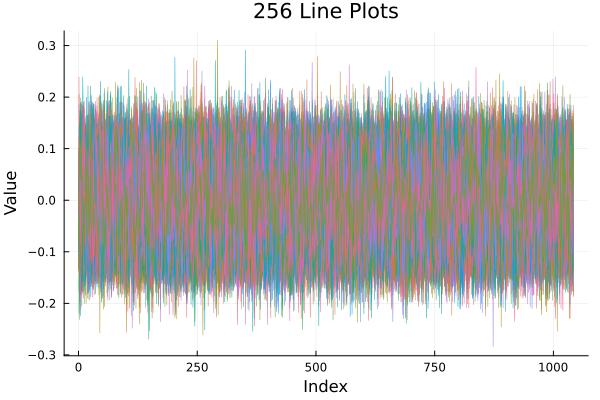

In [13]:
# Create a plot object
p = plot(title="256 Line Plots", xlabel="Index", ylabel="Value", legend=false)

# Add each column as a line plot
for i in 1:size(rankdata.raw[1][1][1][99], 2)
    plot!(p, rankdata.raw[1][1][1][99][:, i], label="", lw=0.5)
end

# Display the plot
display(p)
